# Segmentation

During the last two notebooks we have encountered a complication in our dataset. The **image-level labelling** (or weak labelling).

It is time to try and investigate how we approach our inital training data a little more. We have many organelles present in one image. We therefore need to segment the image to gain some spatial inforamtion on our labelling.

I will be using the [HPA-Cell-Segmentation](https://github.com/CellProfiling/HPA-Cell-Segmentation) tool to segment the iamges. 

I will also be following closely to [this kaggle notebook](https://www.kaggle.com/ayuraj/hpa-segmentation-mask-visualization-with-w-b) as a guide to using the segmentation tool. [Also this kaggle notebook](https://www.kaggle.com/lnhtrang/hpa-public-data-download-and-hpacellseg)

In [2]:
import torch
torch.cuda.is_available()

True

In [3]:
#GPU count and name
!nvidia-smi -L

GPU 0: GeForce GTX 970 (UUID: GPU-fa9c9266-bf91-80d3-02fb-e1c62bb66c85)


In [4]:
# import example images

import glob

WORKING_DIR_PATH = '../input/'
red_images = sorted(glob.glob(WORKING_DIR_PATH+'label_examples/*_red.png'))
green_images = sorted(glob.glob(WORKING_DIR_PATH+'label_examples/*_green.png'))
blue_images = sorted(glob.glob(WORKING_DIR_PATH+'label_examples/*_blue.png'))
yellow_images = sorted(glob.glob(WORKING_DIR_PATH+'label_examples/*_yellow.png'))

print(len(red_images), len(green_images), len(blue_images), len(yellow_images))

5 5 5 5


In [5]:
id_s = [red_images[i].split('_red')[0].split('\\')[1].strip()\
        for i in range(len(red_images))]
id_s

['000a6c98-bb9b-11e8-b2b9-ac1f6b6435d0',
 'a34d8680-bb99-11e8-b2b9-ac1f6b6435d0',
 'a7faf0b4-bb99-11e8-b2b9-ac1f6b6435d0',
 'b6a469d8-bbad-11e8-b2ba-ac1f6b6435d0',
 'f0ac7116-bb99-11e8-b2b9-ac1f6b6435d0']

In [6]:
import pandas as pd
# Find example rows from train.csv
train_csv = pd.read_csv(WORKING_DIR_PATH+'train.csv')
df = train_csv[train_csv.ID.isin(id_s)].reset_index(drop=True)
df

,ID,Label
0,a34d8680-bb99-11e8-b2b9-ac1f6b6435d0,18
1,a7faf0b4-bb99-11e8-b2b9-ac1f6b6435d0,17
2,f0ac7116-bb99-11e8-b2b9-ac1f6b6435d0,15
3,000a6c98-bb9b-11e8-b2b9-ac1f6b6435d0,7|1|2|0
4,b6a469d8-bbad-11e8-b2ba-ac1f6b6435d0,11


In [7]:
# Column mapping for organelles
label_map = {
    '0': 'Nucleoplasm',
    '1': 'Nuclear membrane',
    '2': 'Nucleoli',
    '3': 'Nucleoli fibrillar center',
    '4': 'Nuclear speckles',
    '5': 'Nuclear bodies',
    '6': 'Endoplasmic reticulum',
    '7': 'Golgi apparatus',
    '8': 'Intermediate filaments',
    '9': 'Actin filaments',
    '10': 'Microtubules',
    '11': 'Mitotic spindle',
    '12': 'Centrosome',
    '13': 'Plasma membrane',
    '14': 'Mitochondria',
    '15': 'Aggresome',
    '16': 'Cytosol',
    '17': 'Vesicles and punctate cytosolic patterns',
    '18': 'Negative'
}

## HPA segmenation tool
From https://github.com/CellProfiling/HPA-Cell-Segmentation

!pip install https://github.com/CellProfiling/HPA-Cell-Segmentation/archive/master.zip --user

Run the above into your env. I have included it into the conda enviroment. So I won't run this in the notebook.

In [8]:
# assigning bio style variables to images
mt = red_images # microtubules
er = yellow_images # endoplasmic reticulum
nu = blue_images # nucleus 
pr = green_images # [proteins]
images = [mt, er, nu]

In [9]:
# HPA
import os
import imageio
import hpacellseg.cellsegmentator as cellsegmentator
from hpacellseg.utils import label_cell, label_nuclei
NUC_MODEL = "./nuclei-model.pth"
CELL_MODEL = "./cell-model.pth"

segmentator = cellsegmentator.CellSegmentator(
    NUC_MODEL,
    CELL_MODEL,
    scale_factor=0.25,
    device="cuda",
    padding=False,
    multi_channel_model=True,
)

# For nuclei
nuc_segmentations = segmentator.pred_nuclei(images[2])

# For full cells
cell_segmentations = segmentator.pred_cells(images)

# post-processing
for i, pred in enumerate(cell_segmentations):
    nuclei_mask, cell_mask = label_cell(nuc_segmentations[i], cell_segmentations[i])
    FOVname = os.path.basename(mt[i]).replace('red','predictedmask')
    imageio.imwrite('../input/label_examples/'+ FOVname, cell_mask) 


please compile abn


C:\Users\Admin\miniconda3\envs\cell\lib\site-packages\torch\serialization.py:656: SourceChangeWarning: source code of class 'pytorch_zoo.unet.DPNUnet' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
C:\Users\Admin\miniconda3\envs\cell\lib\site-packages\torch\serialization.py:656: SourceChangeWarning: source code of class 'torch.nn.modules.container.ModuleList' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
C:\Users\Admin\miniconda3\envs\cell\lib\site-packages\torch\serialization.py:656: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by a

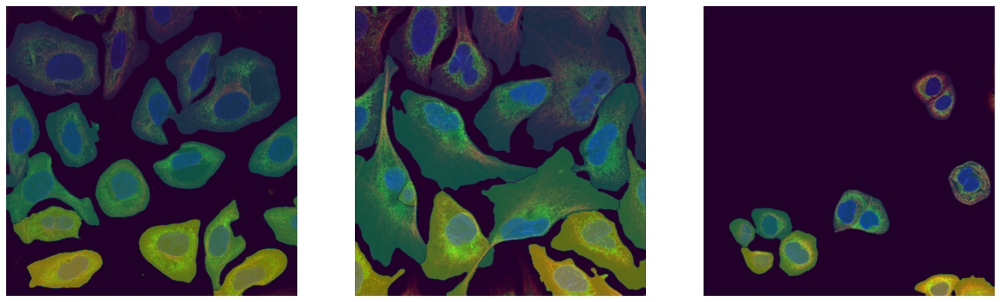

In [13]:
# Visualizing the segmentation masks we just predicted above

import numpy as np
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1,3, figsize=(20,50))
for i in range(3):
    microtubule = plt.imread(mt[i])    
    endoplasmicrec = plt.imread(er[i])    
    nuclei = plt.imread(nu[i])
    mask = plt.imread(mt[i].replace('red','predictedmask'))
    img = np.dstack((microtubule, endoplasmicrec, nuclei))
    ax[i].imshow(img)
    ax[i].imshow(mask, alpha=0.5)
    ax[i].axis('off')
plt.show()

## A bit of explanation of the filters

What do all the channels show.

In [19]:
# Chosen image
golgi = df.loc[3]

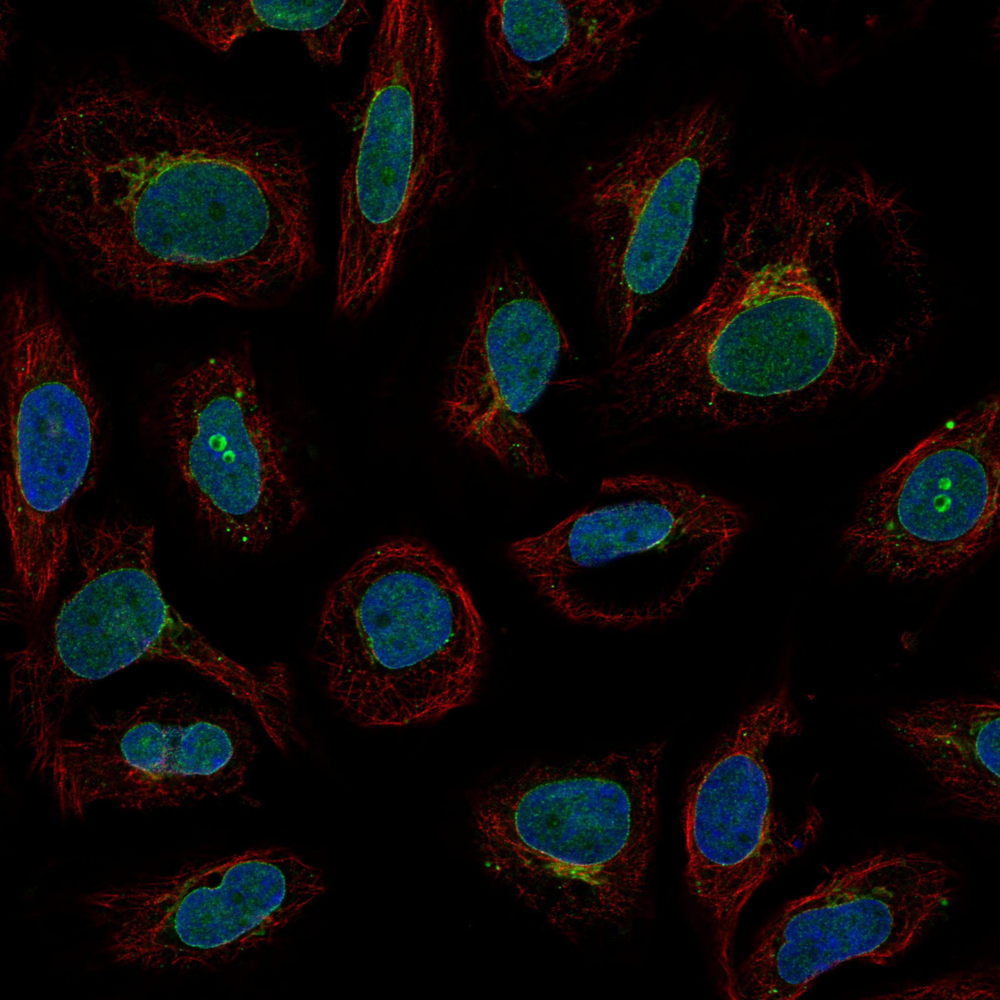

In [21]:
from PIL import Image
i_d = golgi.ID
r = Image.open('../input/label_examples/'+i_d+'_red.png')
g = Image.open('../input/label_examples/'+i_d+'_green.png')
b = Image.open('../input/label_examples/'+i_d+'_blue.png')
y = Image.open('../input/label_examples/'+i_d+'_yellow.png')
rgb = Image.merge("RGB",(r,g,b))
rgb

So this is our test image. Within this image are the labels 7|1|2|0 or Golgi apparatus, Nuclear membrane, Nucleoli and Nucleoplasm respectively.

### [Golgi appratus](https://en.wikipedia.org/wiki/Golgi_apparatus)

The subcellular localization of the Golgi apparatus varies among eukaryotes. In mammals, a single Golgi apparatus is usually located near the cell nucleus, close to the centrosome. Tubular connections are responsible for linking the stacks together, it packages proteins into membrane-bound vesicles inside the cell before the vesicles are sent to their destination.

### [Nuclear membrane (or envelope)](https://en.wikipedia.org/wiki/Nuclear_envelope)
The nuclear envelope, also known as the nuclear membrane,[1][a] is made up of two lipid bilayer membranes that in eukaryotic cells surrounds the nucleus, which encases the genetic material.

### [Nucleoli](https://en.wikipedia.org/wiki/Nucleolus)
The nucleolus is the largest structure in the nucleus of eukaryotic cells. Surrounded by the nuclear membrane.

### [Nucleoplasm](https://en.wikipedia.org/wiki/Nucleoplasm)
The nucleoplasm is a type of protoplasm, and is enveloped by the nuclear envelope (also known as the nuclear membrane).

From the task:

"The labels you will get for training are image level labels while the task is to predict cell level labels. That is to say, each training image contains a number of cells that have collectively been labeled as described above and the prediction task is to look at images of the same type and predict the labels of each individual cell within those images."

Depending on how the accurate the segmentation tool is (~ 90%), we will have roughly 19 segmentations in this image alone. All of which will be assigned the label 7|1|2|0. 

**Confusion** Don't all cells have these labels? Otherwise it wouldn't be a cell?

Well let's quickly look at another image. Then we can do a side by side.

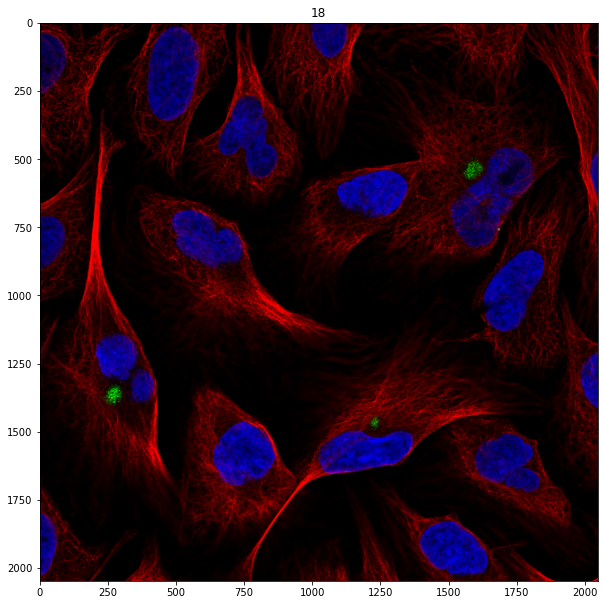

In [22]:
# quick look at another image.
def show_image(i_d, path='../input/label_examples/'):
    red    = Image.open(path+i_d+'_red.png')
    green  = Image.open(path+i_d+'_green.png')
    blue   = Image.open(path+i_d+'_blue.png')
    yellow = Image.open(path+i_d+'_yellow.png')
    rgb = Image.merge("RGB", (red, green, blue))
    return rgb

def get_channel(i_d, path='../input/label_examples/', channel = 'g'):
    if channel == 'r':
        return Image.open(path+i_d+'_red.png')
    if channel == 'g':
        return Image.open(path+i_d+'_green.png')
    if channel == 'b':
        return Image.open(path+i_d+'_blue.png')
    if channel == 'y':
        return Image.open(path+i_d+'_yellow.png')

fig, ax = plt.subplots(figsize=(10,15))
ax.imshow(show_image(df.loc[0, 'ID']))
ax.set_title('18')
plt.show()

The label 18 or negative is an example of unspecifc signal example in the dataset (only 34 ind dataset), so I won't bother going into too much detail.

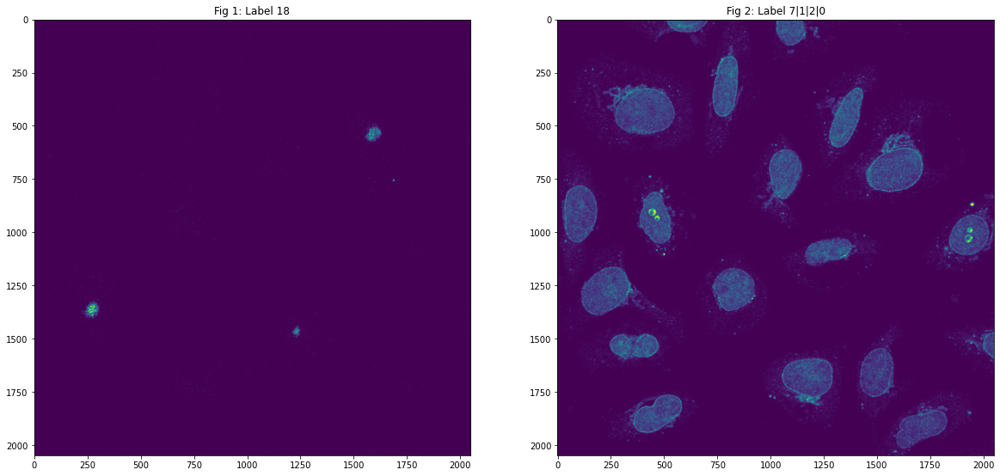

In [23]:
# get both green channels
g1 = get_channel(df.loc[0, 'ID'], channel = 'g')
g2 = get_channel(golgi.ID, channel = 'g')

fig, ax = plt.subplots(1,2, figsize=(20,50))
ax[0].imshow(g1)
ax[0].set_title('Fig 1: Label 18')
ax[1].imshow(g2)
ax[1].set_title('Fig 2: Label 7|1|2|0')
plt.show()

(Double click on images to zoom in)

Clearly by looking at the green channel only, protein specfic. We can see not much is going on in Fig 1. However in Fig 2 we can see some the membrane, golgi and well I am not biologist but there is clearly more going on.

With the same images let's just quickly do the blue / red channel. This should highlight the nucleus / microtubles.

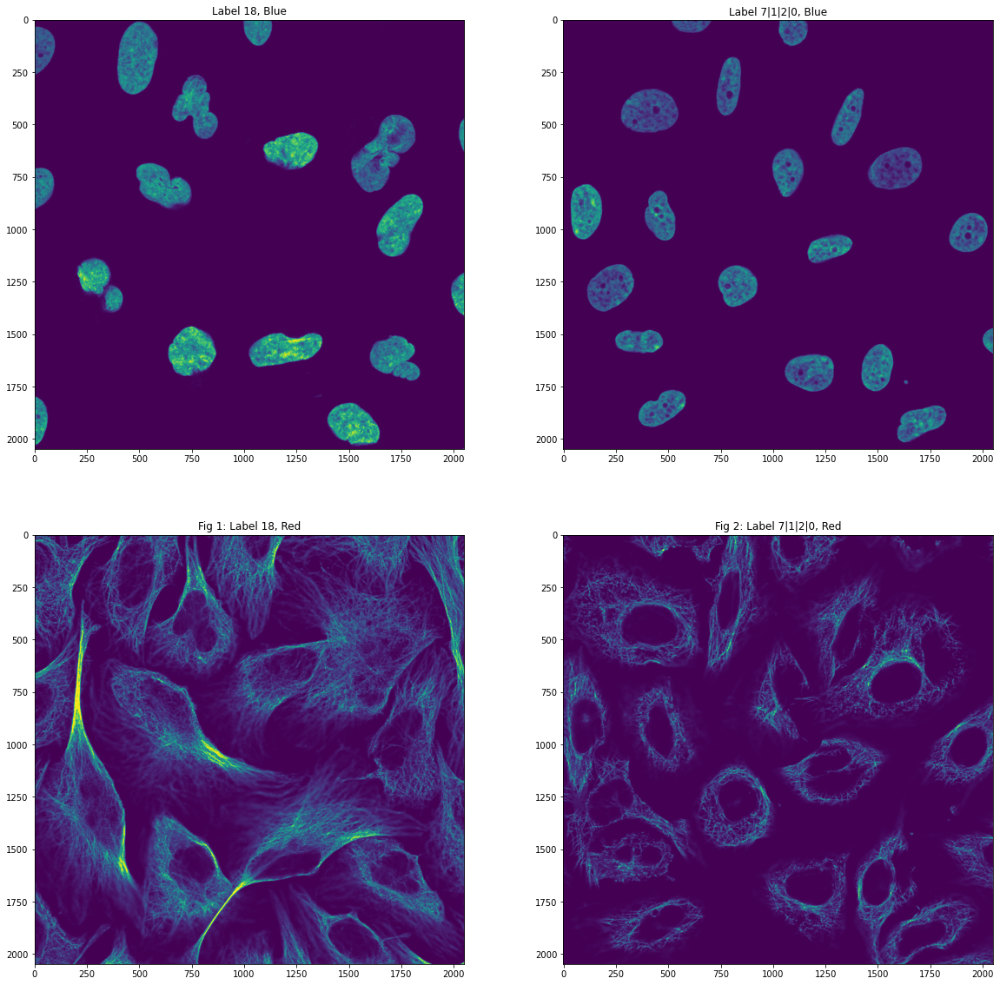

In [24]:
# get both blue channels
b1 = get_channel(df.loc[0, 'ID'], channel = 'b')
b2 = get_channel(golgi.ID, channel = 'b')

r1 = get_channel(df.loc[0, 'ID'], channel = 'r')
r2 = get_channel(golgi.ID, channel = 'r')

fig, ax = plt.subplots(2,2, figsize=(20,20))
# Blue images

ax[0, 0].imshow(b1)
ax[0, 0].set_title('Label 18, Blue')
ax[0, 1].imshow(b2)
ax[0, 1].set_title('Label 7|1|2|0, Blue')

# Red images

ax[1, 0].imshow(r1)
ax[1, 0].set_title('Fig 1: Label 18, Red')
ax[1, 1].imshow(r2)
ax[1, 1].set_title('Fig 2: Label 7|1|2|0, Red')

plt.show()

Again they don't look too disimilar in the blue filter. However in the red filter (microtubles) we can see some more differences.

Label 18 is not very helpful to look at. So I am going to look at another.

Label 15 or Aggresome should show some more dramatic comparisons compared to label 7|1|2|0. 

### [Aggresome](https://en.wikipedia.org/wiki/Aggresome)
In eukaryotic cells, an aggresome refers to an aggregation of misfolded proteins in the cell, formed when the protein degradation system of the cell is overwhelmed. Aggresome formation is a highly regulated process that possibly serves to organize misfolded proteins into a single location.

From its description it should be lighting up on the green filter.

In [25]:
# Aggresome cell
agg = df.loc[2]
agg

ID       f0ac7116-bb99-11e8-b2b9-ac1f6b6435d0
Label                                      15
Name: 2, dtype: object

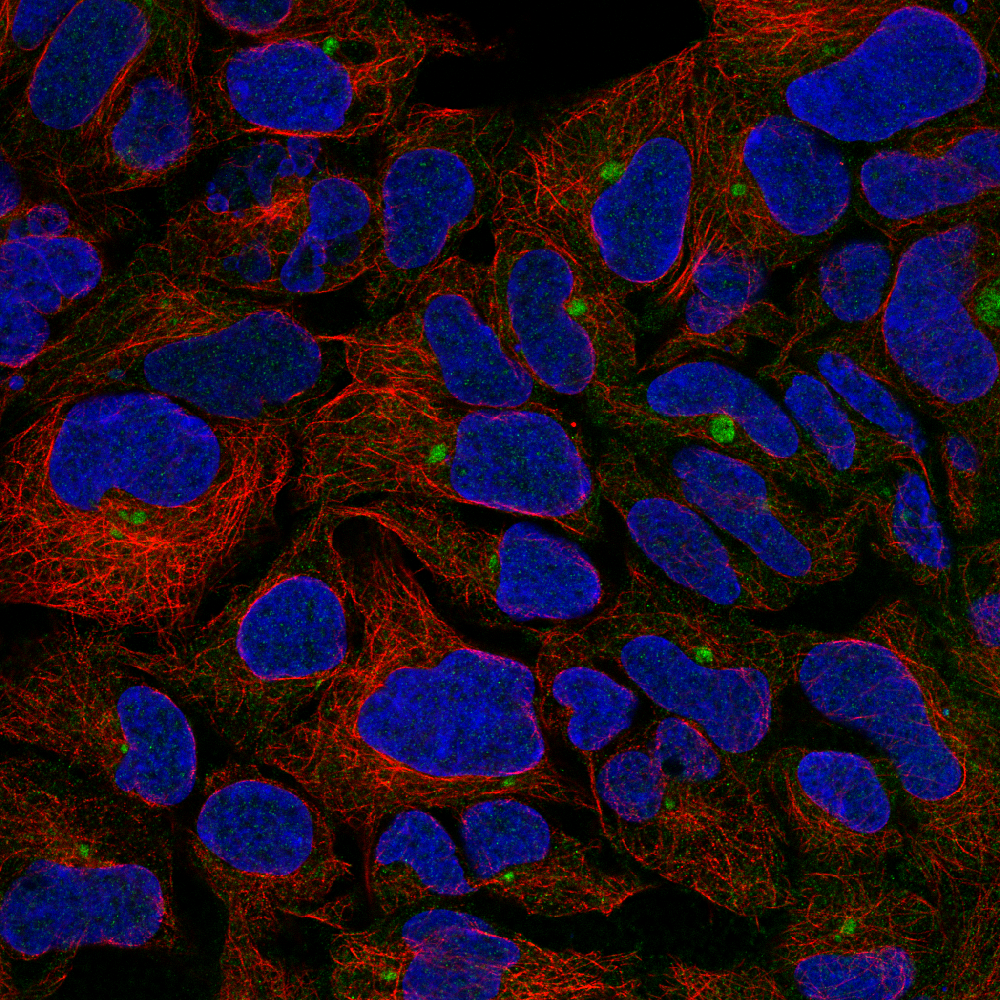

In [26]:
show_image(agg.ID)

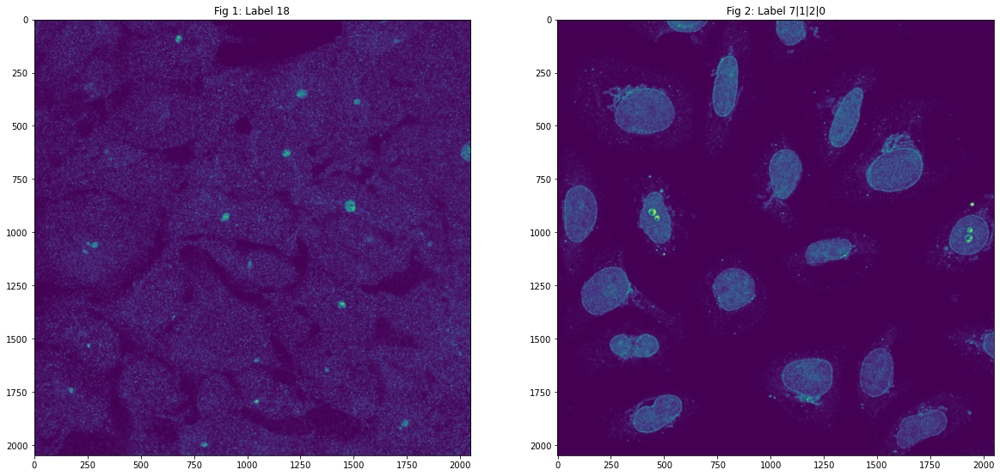

In [27]:
# get both green channels
g1 = get_channel(agg.ID, channel = 'g')
g2 = get_channel(golgi.ID, channel = 'g')

fig, ax = plt.subplots(1,2, figsize=(20,50))
ax[0].imshow(g1)
ax[0].set_title('Fig 1: Label 18')
ax[1].imshow(g2)
ax[1].set_title('Fig 2: Label 7|1|2|0')
plt.show()

Aggresome does not have the cells forming so nicely compared to the golgi picture? However there is protein apparent all over the image, it is just not so dense and compact as a cell is?

## More in depth masks
The HPA cell segmentation tools helps mask the cells and the nuclei. Instead of masking multiple images as shown before let's just do one and work out what is going on.

In [28]:
i_d = golgi.ID
r = ['../input/label_examples/'+i_d+'_red.png']
g = ['../input/label_examples/'+i_d+'_green.png']
b = ['../input/label_examples/'+i_d+'_blue.png']
y = ['../input/label_examples/'+i_d+'_yellow.png']

In [29]:
# assigning bio style variables to images
mt = r # microtubules
er = y # endoplasmic reticulum
nu = b # nucleus 
# we don't need green for cell seg, as all proteins will be contained within masks?
images = [mt, er, nu]

In [30]:
segmentator = cellsegmentator.CellSegmentator(
    NUC_MODEL,
    CELL_MODEL,
    scale_factor=0.25,
    device="cuda",
    padding=False,
    multi_channel_model=True,
)

# For nuclei
nuc_segmentations = segmentator.pred_nuclei(images[2])

# For full cells
cell_segmentations = segmentator.pred_cells(images)

C:\Users\Admin\miniconda3\envs\cell\lib\site-packages\torch\serialization.py:656: SourceChangeWarning: source code of class 'pytorch_zoo.unet.DPNUnet' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
C:\Users\Admin\miniconda3\envs\cell\lib\site-packages\torch\serialization.py:656: SourceChangeWarning: source code of class 'torch.nn.modules.container.ModuleList' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
C:\Users\Admin\miniconda3\envs\cell\lib\site-packages\torch\serialization.py:656: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by a

In [82]:
# Check same shape
print(nuc_segmentations[0].shape)
print(cell_segmentations[0].shape)
rgb_array = np.array(rgb)
print(rgb_array.shape)

(2048, 2048, 3)
(2048, 2048, 3)
(2048, 2048, 3)


In [76]:
# Mask arrays
masked_nuc = np.where(nuc_segmentations[0]>0,rgb_array, nuc_segmentations[0])
masked_cell = np.where(cell_segmentations[0]>0,rgb_array, cell_segmentations[0])

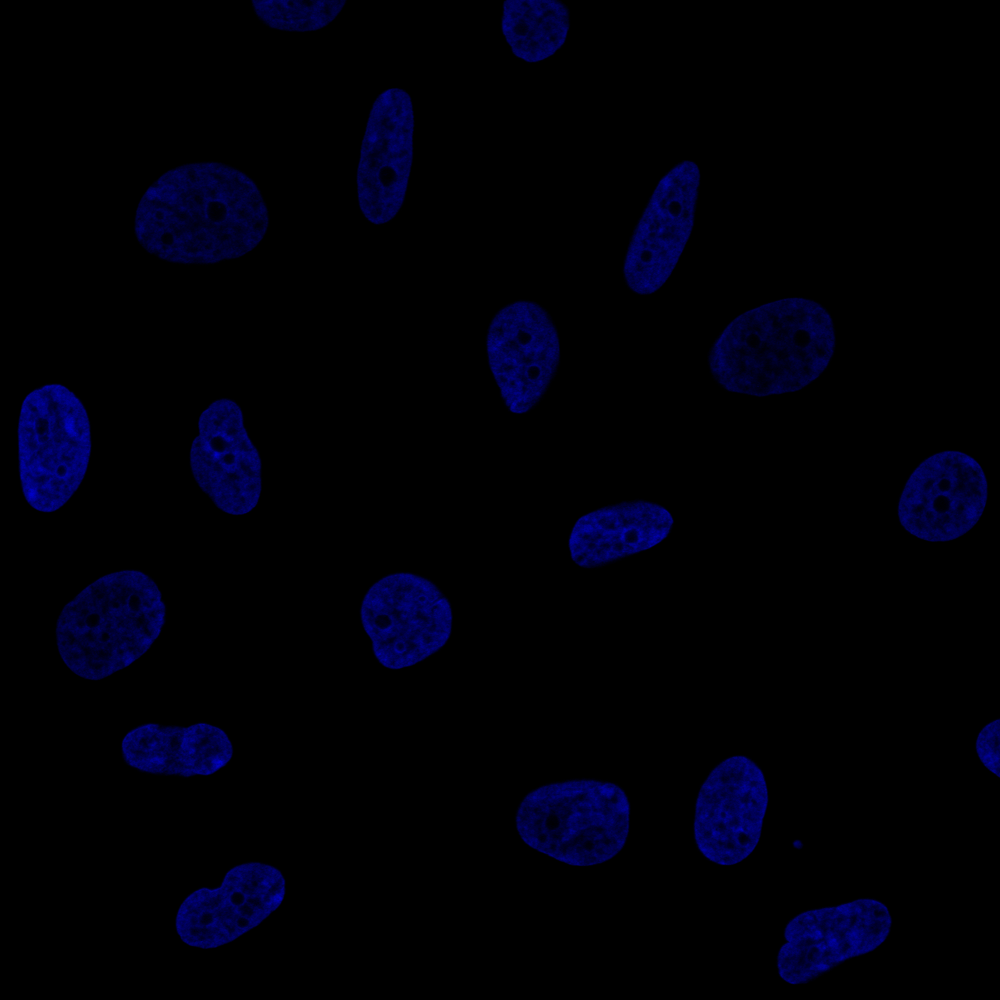

In [77]:
# masked nuc
masked_nuc_im = Image.fromarray(masked_nuc)
masked_nuc_im

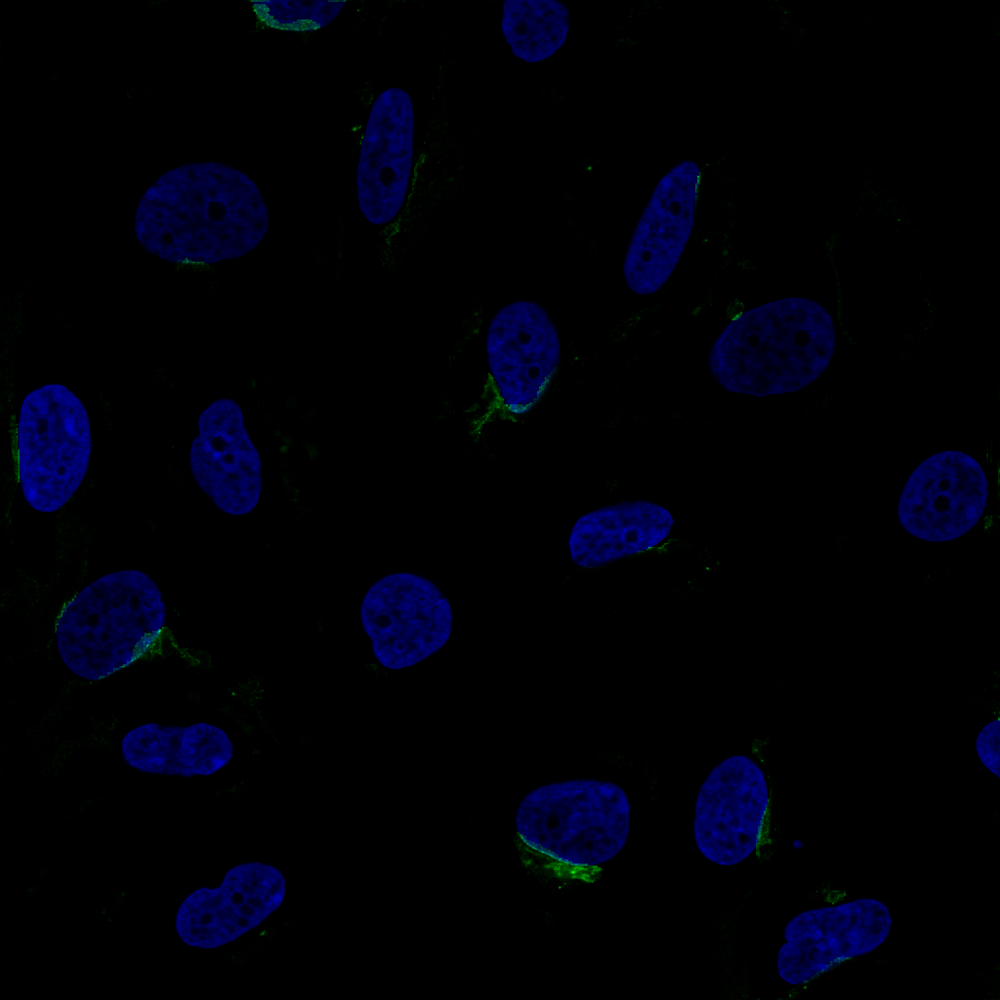

In [83]:
# masked nuc
masked_cell_im = Image.fromarray(masked_cell)
masked_cell_im

So from above we can see the cell and nuc segmentations. The tool also provides us with some post processing. It uses information from the cell-predictions to make better estimates.

This then returns a mask array where 0's in the data arrays indicate background while a continous strech of a specific number indicates the area for a specific cell.

In [104]:
# post-processing
nuclei_mask, cell_mask = label_cell(nuc_segmentations[0], cell_segmentations[0])

(-0.5, 2047.5, 2047.5, -0.5)

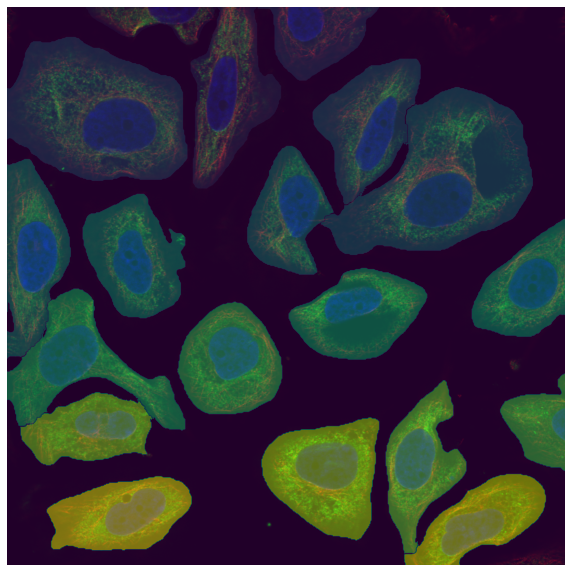

In [114]:
# show full mask
fig, ax = plt.subplots(figsize=(10,15))
microtubule = plt.imread(mt[0])    
endoplasmicrec = plt.imread(er[0])    
nuclei = plt.imread(nu[0])
mask = cell_mask
img = np.dstack((microtubule, endoplasmicrec, nuclei))
ax.imshow(img)
ax.imshow(mask, alpha=0.5)
ax.axis('off')

In [118]:
# Show how segmentations are stored
df_mask = pd.Series(cell_mask.flatten())
df_mask.value_counts()

0     1908363
6      280530
4      269013
17     138348
12     134219
2      133405
5      123002
13     118618
9      117531
8      117346
11     113627
19     106978
15      99000
10      95328
18      94684
7       92271
16      88957
3       73027
14      50405
1       39652
dtype: int64

From the github, each segment is assigned an integer value in the array. So seg 1 is all pixels where the value = 1. As mentioned earlier we have 19 segments, each with its own mask.

I will leave the mask stuff here as I am not sure what the required input format will be for our instance segmentation mode.

Now we have this running we can start delving into some instance segmentation models accounting for the weak labelling.